<AxesSubplot:xlabel='pos'>

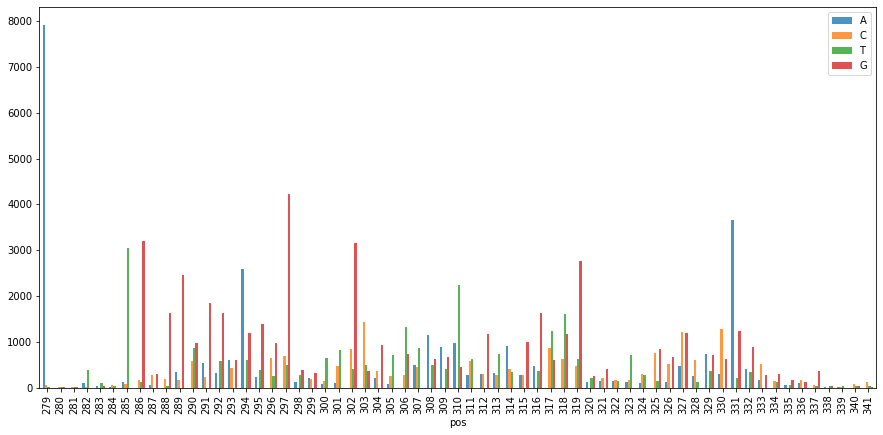

In [1]:
###############################################################################
# Task 1 - make a histogram of A, C, T and G
###############################################################################

import pandas as pd
import pandas_profiling
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
import re

df = pd.read_csv('train.csv')

# Numbre of ACTG for each position we already have in Data Frame.
# Therefore draw BarPlot (not Histogram) to show count of ACTG in
# each position.
df.plot(x='pos', y=['A', 'C', 'T', 'G'], kind="bar", width=0.7,
        alpha=0.8, figsize=(15, 7))


In [2]:
###############################################################################
# Task 2 - store subframe
###############################################################################

# Just do a query and store result as CSV-file
df = pd.read_csv('train.csv')
sub_df = df.query('matches > @df["matches"].mean()')[
    ['pos', 'reads_all', 'mismatches', 'deletions', 'insertions']]
sub_df.to_csv('train_part.csv')
# sub_df

In [3]:
###############################################################################
# Task 3 - make EDA of some dataset
###############################################################################

mpl.rcParams.update(mpl.rcParamsDefault)

# Make EDA of Pokemon dataset
df = pd.read_csv('Pokemon.csv')
df

,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
0,1,Bulbasaur,Grass,Poison,318,45,49,49,65,65,45,1,False
1,2,Ivysaur,Grass,Poison,405,60,62,63,80,80,60,1,False
2,3,Venusaur,Grass,Poison,525,80,82,83,100,100,80,1,False
3,3,VenusaurMega Venusaur,Grass,Poison,625,80,100,123,122,120,80,1,False
4,4,Charmander,Fire,NaN,309,39,52,43,60,50,65,1,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
795,719,Diancie,Rock,Fairy,600,50,100,150,100,150,50,6,True
796,719,DiancieMega Diancie,Rock,Fairy,700,50,160,110,160,110,110,6,True
797,720,HoopaHoopa Confined,Psychic,Ghost,600,80,110,60,150,130,70,6,True
798,720,HoopaHoopa Unbound,Psychic,Dark,680,80,160,60,170,130,80,6,True


In [4]:
# Look through ...
df.info()
# Dataset contains numerical and categorical parameters.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 800 entries, 0 to 799
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   #           800 non-null    int64 
 1   Name        800 non-null    object
 2   Type 1      800 non-null    object
 3   Type 2      414 non-null    object
 4   Total       800 non-null    int64 
 5   HP          800 non-null    int64 
 6   Attack      800 non-null    int64 
 7   Defense     800 non-null    int64 
 8   Sp. Atk     800 non-null    int64 
 9   Sp. Def     800 non-null    int64 
 10  Speed       800 non-null    int64 
 11  Generation  800 non-null    int64 
 12  Legendary   800 non-null    bool  
dtypes: bool(1), int64(9), object(3)
memory usage: 75.9+ KB


In [5]:
# Look at NULL data
df.isnull().sum()
# We can see that 'Type 2' has a lot of (~50%) NULL values,
# therefore ignore them.

#               0
Name            0
Type 1          0
Type 2        386
Total           0
HP              0
Attack          0
Defense         0
Sp. Atk         0
Sp. Def         0
Speed           0
Generation      0
Legendary       0
dtype: int64

### Univariate Analysis

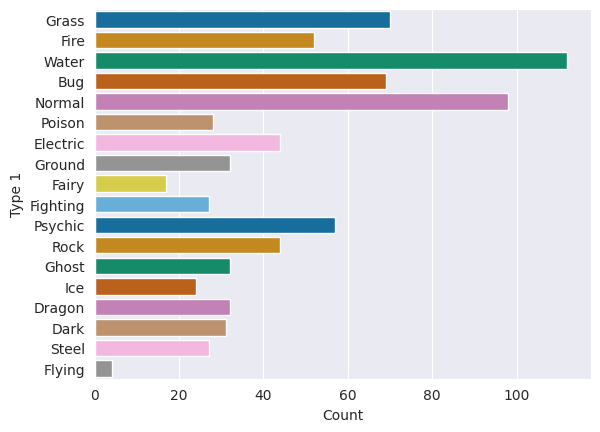

In [6]:
# Look at distribution of 'Type 1'
sns.set_style('darkgrid')
sns.countplot(y='Type 1', data=df, palette='colorblind')
plt.xlabel('Count')
plt.ylabel('Type 1')
plt.show()
# We can see that Water and Normal pokemon's type prevail,
# while Flying is the smallest type

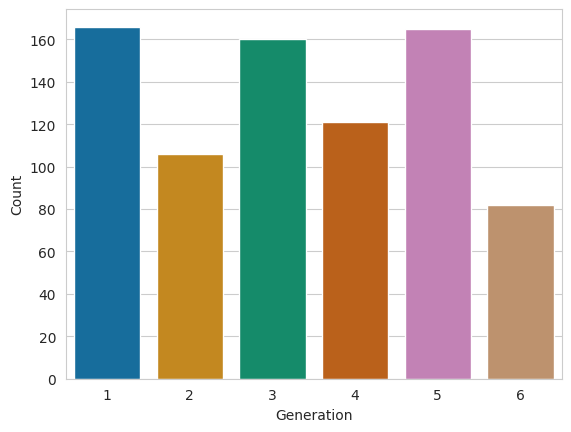

In [7]:
# Look at distribution of 'Generation'
sns.set_style('whitegrid')
sns.countplot(x='Generation', data=df, palette='colorblind')
plt.xlabel("Generation")
plt.ylabel("Count")
plt.show()
# We can see that number of Pokemons interchange throught the generations

Text(0, 0.5, 'Count')

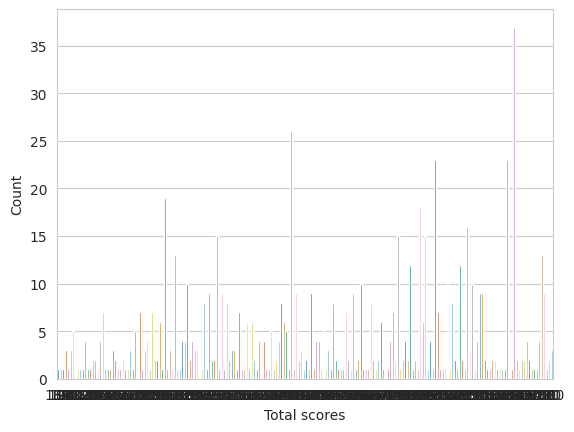

In [8]:
# Look at distribution of 'Score'
sns.set_style('whitegrid')
sns.countplot(x='Total', data=df, palette='colorblind')
plt.xlabel('Total scores')
plt.ylabel('Count')
# plt.show()
# We can see thar there are a lot of pokemons with differents scores.

### Multivariate analysis

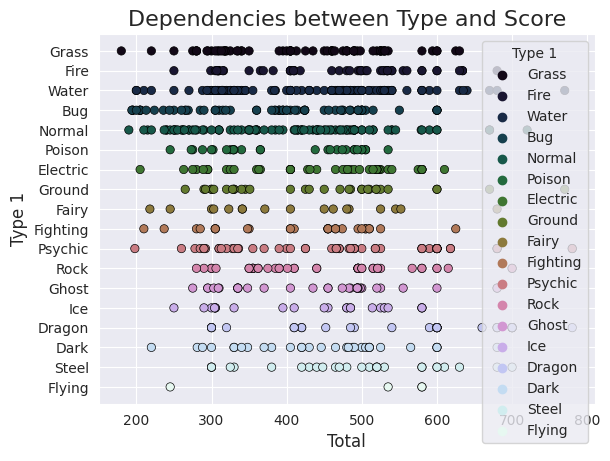

In [9]:
# Look at dependencies between Type and Total
sns.set_style('darkgrid')
plt.title('Dependencies between Type and Score', size=16)
plt.xlabel('Total', size=12)
plt.ylabel('Type 1', size=12)
sns.scatterplot(x='Total', y='Type 1', data=df, hue='Type 1',
                edgecolor='black', palette='cubehelix')
plt.show()
# We can not see any significant dependencies between Type and Total.

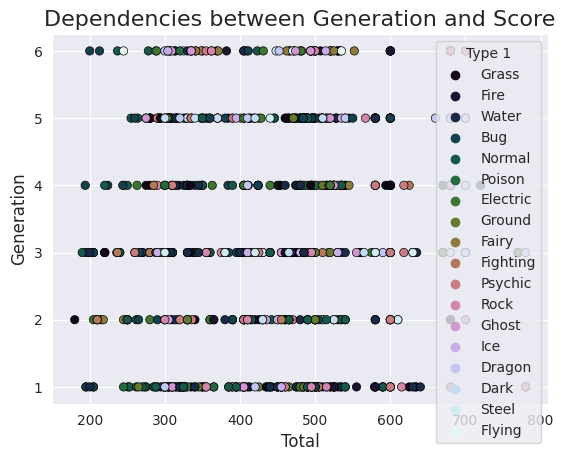

In [10]:
# Look at dependencies between Generation and Total
sns.set_style('darkgrid')
plt.title('Dependencies between Generation and Score', size=16)
plt.xlabel('Total', size=12)
plt.ylabel('Generation', size=12)
sns.scatterplot(x='Total', y='Generation', data=df, hue='Type 1',
                edgecolor='black', palette='cubehelix')
plt.show()
# We can not see any significant dependencies between Generation and Score.

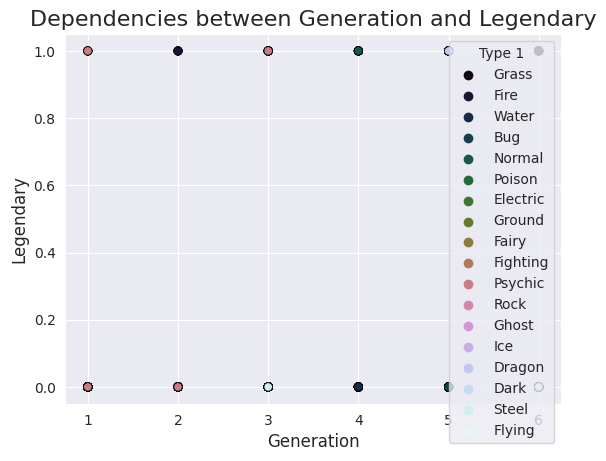

In [11]:
# Look at dependencies between Generation and Legendary
sns.set_style('darkgrid')
plt.title('Dependencies between Generation and Legendary', size=16)
plt.xlabel('Generation', size=12)
plt.ylabel('Legendary', size=12)
sns.scatterplot(x='Generation', y='Legendary', data=df, hue='Type 1',
                edgecolor='black', palette='cubehelix')
plt.show()
# We can not see any significant dependencies between Generation and Legendary.

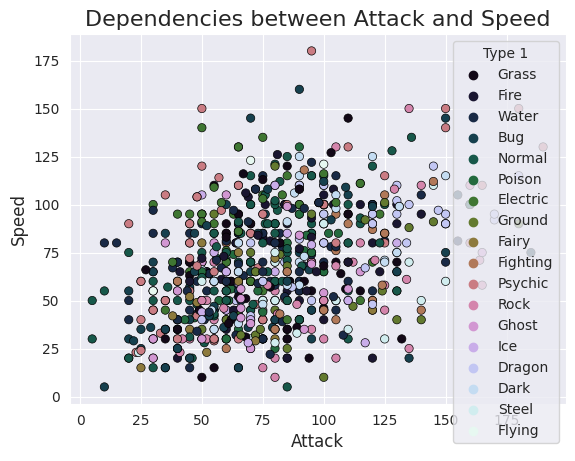

In [12]:
# Look at dependencies between Attack and Speed
sns.set_style('darkgrid')
plt.title('Dependencies between Attack and Speed', size=16)
plt.xlabel('Attack', size=12)
plt.ylabel('Speed', size=12)
sns.scatterplot(x='Attack', y='Speed', data=df, hue='Type 1',
                edgecolor='black', palette='cubehelix')
plt.show()
# We can see moderate dependency between Attack and Speed.

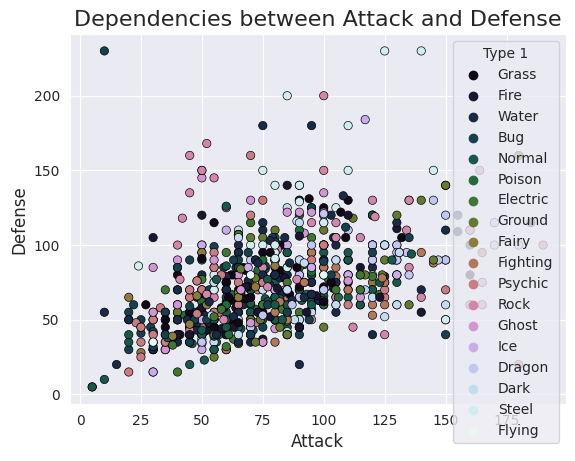

In [13]:
# Look at dependencies between Attack and Defense
sns.set_style('darkgrid')
plt.title('Dependencies between Attack and Defense', size=16)
plt.xlabel('Attack', size=12)
plt.ylabel('Defense', size=12)
sns.scatterplot(x='Attack', y='Defense', data=df, hue='Type 1',
                edgecolor='black', palette='cubehelix')
plt.show()
# We can see moderate dependency between Attack and Defense.

<AxesSubplot:ylabel='Density'>

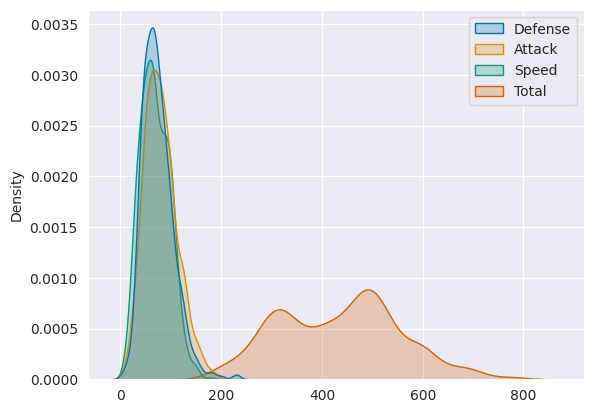

In [14]:
# Let's estimate the distribution of several combat parameters
kde_data = df[['Defense', 'Attack', 'Speed', 'Total']]

sns.set_style("darkgrid")
sns.kdeplot(data=kde_data, shade=True, palette='colorblind')
# plt.show()

# We see that the values of combat parameters are symmetrically distributed
# (with one peak) in range 0-200 and the Total score is in the range 0-800
# with two pronounced peaks at 300 and 500.

#### Summary for EDA with Pandas:
Using Univariate and Multivariate analysis and 'manual' selection of
several parameters failed to identify clear features of the data and
correlations between the values.

### Pandas profiling

In [15]:
# For a more complete overview of possible dependencies,
# let's try using the pandas_profiling library

pandas_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Summary for EDA with Pandas_profiling library:
In this large report (especially in the Correlations section) we can see:
1. All combat characteristics correlate with each other to an average degree
    - the higher one characteristic - the higher the other.
2. The Total parameter is in high correlation with all other combat
properties
    - this is logical - Total is the sum of all combat properties.
3. Generation - does not correlate with other characteristics.
4. Legendaries - significantly correlates with combat characteristics,
which is also logical.

### Conclusion
It is more convenient to do the initial analysis of the data using the
pandas_profiling library.

This will allow to see explicit dependencies and, if necessary, examine
them in more details. Data analysis "manually" using Pandas on this data
set turned out to be poorly informative, since in most cases dependencies
between variables are weakly expressed.

In [16]:
###############################################################################
# Task 4 - Extra task (extra 25 points)
###############################################################################

# reading data from .gff file to pandas.DataFrame
def read_gff(path):
    # line format has view:
    #   Reference_10\t barrnap:0.9\t rRNA\t 67122\t 68652\t 0.0\t +\t .\t
    #   Name=16S_rRNA;product=16S ribosomal RNA
    return pd.read_csv(path, sep='\t', skiprows=1,
                       names=['chromosome', 'source', 'type', 'start', 'end',
                              'score', 'strand', 'phase', 'attributes'])


df_gff = read_gff('rrna_annotation.gff')
df_gff

,chromosome,source,type,start,end,score,strand,phase,attributes
0,Reference_10,barrnap:0.9,rRNA,67122,68652,0.000000e+00,+,.,Name=16S_rRNA;product=16S ribosomal RNA
1,Reference_10,barrnap:0.9,rRNA,68981,72061,0.000000e+00,+,.,Name=23S_rRNA;product=23S ribosomal RNA
2,Reference_10,barrnap:0.9,rRNA,469298,470826,0.000000e+00,+,.,Name=16S_rRNA;product=16S ribosomal RNA
3,Reference_10,barrnap:0.9,rRNA,471166,474246,0.000000e+00,+,.,Name=23S_rRNA;product=23S ribosomal RNA
4,Reference_10,barrnap:0.9,rRNA,3629599,3632680,0.000000e+00,-,.,Name=23S_rRNA;product=23S ribosomal RNA
...,...,...,...,...,...,...,...,...,...
343,Reference_25,barrnap:0.9,rRNA,1819878,1822785,0.000000e+00,+,.,Name=23S_rRNA;product=23S ribosomal RNA
344,Reference_25,barrnap:0.9,rRNA,1822913,1823016,2.900000e-10,+,.,Name=5S_rRNA;product=5S ribosomal RNA
345,Reference_25,barrnap:0.9,rRNA,3744056,3744159,2.900000e-10,-,.,Name=5S_rRNA;product=5S ribosomal RNA
346,Reference_25,barrnap:0.9,rRNA,3744287,3747194,0.000000e+00,-,.,Name=23S_rRNA;product=23S ribosomal RNA


In [17]:
# reading data from .bed6 file to pandas.DataFrame
def read_bed6(path):
    # line format has view:
    #   Reference_1/t 197681/t 200286\t NODE_1445_length_2603_cov_1135/t
    #   593799/t  41/t -
    return pd.read_csv(path, sep='\t',
                       names=['chromosome', 'start', 'end', 'name',
                              'score', 'strand'])


df_bed = read_bed6('alignment.bed')
df_bed

,chromosome,start,end,name,score,strand
0,Reference_1,197681,200286,NODE_1445_length_2603_cov_1135.593799,41,-
1,Reference_1,202886,202996,NODE_19543_length_110_cov_1549.290909,0,-
2,Reference_1,202941,203377,NODE_5666_length_436_cov_418.653543,16,+
3,Reference_1,203322,785222,NODE_25_length_581906_cov_146.024228,60,+
4,Reference_1,785169,1763981,NODE_11_length_978812_cov_132.517515,60,-
...,...,...,...,...,...,...
7705,Reference_26,5532432,5535601,NODE_1329_length_3169_cov_103.935132,5,+
7706,Reference_26,5535546,5535722,NODE_19238_length_176_cov_67.305785,0,+
7707,Reference_26,5535667,5537226,NODE_2001_length_1559_cov_98.029920,0,+
7708,Reference_26,5537171,5537343,NODE_19245_length_172_cov_84.367521,0,+


In [18]:
# modifying of values in 'attributes' column

def make_attr_shoter(attr_str):
    m = re.search('product=(.+?) ', attr_str)
    if m:
        return m.group(1)
    return None


df_gff = read_gff('rrna_annotation.gff')
df_gff['attributes'] = df_gff['attributes'].apply(make_attr_shoter)
df_gff

,chromosome,source,type,start,end,score,strand,phase,attributes
0,Reference_10,barrnap:0.9,rRNA,67122,68652,0.000000e+00,+,.,16S
1,Reference_10,barrnap:0.9,rRNA,68981,72061,0.000000e+00,+,.,23S
2,Reference_10,barrnap:0.9,rRNA,469298,470826,0.000000e+00,+,.,16S
3,Reference_10,barrnap:0.9,rRNA,471166,474246,0.000000e+00,+,.,23S
4,Reference_10,barrnap:0.9,rRNA,3629599,3632680,0.000000e+00,-,.,23S
...,...,...,...,...,...,...,...,...,...
343,Reference_25,barrnap:0.9,rRNA,1819878,1822785,0.000000e+00,+,.,23S
344,Reference_25,barrnap:0.9,rRNA,1822913,1823016,2.900000e-10,+,.,5S
345,Reference_25,barrnap:0.9,rRNA,3744056,3744159,2.900000e-10,-,.,5S
346,Reference_25,barrnap:0.9,rRNA,3744287,3747194,0.000000e+00,-,.,23S


In [19]:
# Make a table where for each chromosome (in fact, these are not chromosomes,
# but reference genomes) shows the amount of rRNA of each type.
# We can build a barplot that displays this data

df_gff['attributes'].value_counts()
# There are only 3 types - 23S, 16S and 5S

23S    119
16S    118
5S     111
Name: attributes, dtype: int64

In [20]:
# Look through types of chromosome
df_gff['chromosome'].value_counts().sort_index()
# There are 26 types of chromosome: [Reference_1 .. Reference_26]

Reference_1      6
Reference_10    10
Reference_11     6
Reference_12     6
Reference_13    12
Reference_14    13
Reference_15    24
Reference_16    22
Reference_17    22
Reference_18     7
Reference_19    22
Reference_2     15
Reference_20    31
Reference_21     3
Reference_22    12
Reference_23     3
Reference_24    12
Reference_25     9
Reference_26    12
Reference_3      6
Reference_4     24
Reference_5     18
Reference_6      6
Reference_7     25
Reference_8      4
Reference_9     18
Name: chromosome, dtype: int64

In [21]:
# make new DF with counting of RNA for each type
df_counts = pd.DataFrame(columns=['chromosome', '5S', '16S', '23S'])
for i in range(26):
    ref = 'Reference_' + str(i + 1)
    cnts = df_gff.query('chromosome == @ref')['attributes'].value_counts()
    df_counts.loc[i] = [ref, cnts.get('5S', 0), cnts.get('16S', 0),
                        cnts.get('23S', 0)]

df_counts

,chromosome,5S,16S,23S
0,Reference_1,2,2,2
1,Reference_2,5,5,5
2,Reference_3,2,2,2
3,Reference_4,6,8,10
4,Reference_5,6,6,6
5,Reference_6,2,2,2
6,Reference_7,8,9,8
7,Reference_8,0,2,2
8,Reference_9,6,6,6
9,Reference_10,0,5,5


<AxesSubplot:ylabel='chromosome'>

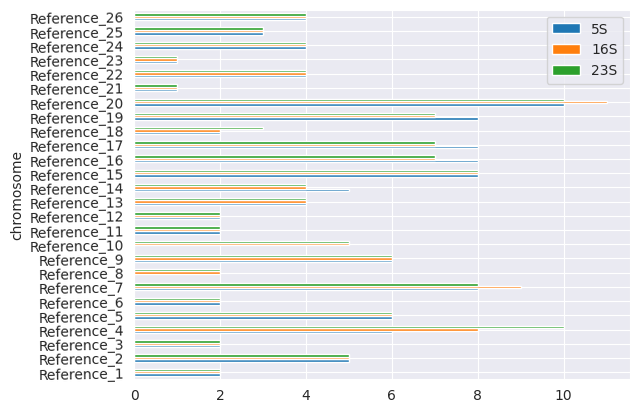

In [22]:
# make bar plot for count_df
df_counts.plot.barh(x='chromosome', y=['5S', '16S', '23S'], rot=1)

In [23]:
# Task:
# We want to know how much rRNA was successfully assembled during
# assembly. To do this, you can use the bedtools intersect program
# and intersect these two files. As a result, only rRNA records are
# saved, the interval of which overlapped with the contig interval
# in the alignment, which means that this gene is in the assembly.
# But forget the bedtools! We actually have a pandas here! So let's
# get the same result in it. Output a table containing the original
# records about the rRNAs completely included in the assembly
# (not a fragment), as well as a record about the contig in which
# this RNA fell. The resulting table should look something like Example2.
# Please note that several rRNAs can fall into one contig.

# Look again at the data frames

df_gff = read_gff('rrna_annotation.gff')
df_gff

,chromosome,source,type,start,end,score,strand,phase,attributes
0,Reference_10,barrnap:0.9,rRNA,67122,68652,0.000000e+00,+,.,Name=16S_rRNA;product=16S ribosomal RNA
1,Reference_10,barrnap:0.9,rRNA,68981,72061,0.000000e+00,+,.,Name=23S_rRNA;product=23S ribosomal RNA
2,Reference_10,barrnap:0.9,rRNA,469298,470826,0.000000e+00,+,.,Name=16S_rRNA;product=16S ribosomal RNA
3,Reference_10,barrnap:0.9,rRNA,471166,474246,0.000000e+00,+,.,Name=23S_rRNA;product=23S ribosomal RNA
4,Reference_10,barrnap:0.9,rRNA,3629599,3632680,0.000000e+00,-,.,Name=23S_rRNA;product=23S ribosomal RNA
...,...,...,...,...,...,...,...,...,...
343,Reference_25,barrnap:0.9,rRNA,1819878,1822785,0.000000e+00,+,.,Name=23S_rRNA;product=23S ribosomal RNA
344,Reference_25,barrnap:0.9,rRNA,1822913,1823016,2.900000e-10,+,.,Name=5S_rRNA;product=5S ribosomal RNA
345,Reference_25,barrnap:0.9,rRNA,3744056,3744159,2.900000e-10,-,.,Name=5S_rRNA;product=5S ribosomal RNA
346,Reference_25,barrnap:0.9,rRNA,3744287,3747194,0.000000e+00,-,.,Name=23S_rRNA;product=23S ribosomal RNA


In [24]:
df_bed = read_bed6('alignment.bed')
df_bed

,chromosome,start,end,name,score,strand
0,Reference_1,197681,200286,NODE_1445_length_2603_cov_1135.593799,41,-
1,Reference_1,202886,202996,NODE_19543_length_110_cov_1549.290909,0,-
2,Reference_1,202941,203377,NODE_5666_length_436_cov_418.653543,16,+
3,Reference_1,203322,785222,NODE_25_length_581906_cov_146.024228,60,+
4,Reference_1,785169,1763981,NODE_11_length_978812_cov_132.517515,60,-
...,...,...,...,...,...,...
7705,Reference_26,5532432,5535601,NODE_1329_length_3169_cov_103.935132,5,+
7706,Reference_26,5535546,5535722,NODE_19238_length_176_cov_67.305785,0,+
7707,Reference_26,5535667,5537226,NODE_2001_length_1559_cov_98.029920,0,+
7708,Reference_26,5537171,5537343,NODE_19245_length_172_cov_84.367521,0,+


In [25]:
# Go through df_gff and check for existing in df_bed

# resulr DF will be based on original GFF dataframe
df_res = df_gff

# rename several coulumns
df_res.rename(inplace=True,
              columns={'start': 'start_x', 'end': 'end_x',
                       'score': 'score_x', 'strand': 'strand_x'})

# prepare some lists to add them to DF after
drops = []
start_y = []
end_y = []
name_y = []
score_y = []
strand_y = []

# go through DF, prepare lists with aditional info,
# remove lines without intersection
for i in range(df_res.shape[0]):
    # print(f'### {i} ###')
    row = df_res.iloc[i]
    match = df_bed.query('chromosome == @row["chromosome"] and ' +
                         'start <= @row["start_x"] and ' +
                         'end >= @row["end_x"]')
    if match.shape[0] == 1:  # one intersection
        start_y.append(match['start'].iloc[0])
        end_y.append(match['end'].iloc[0])
        name_y.append(match['name'].iloc[0])
        score_y.append(match['score'].iloc[0])
        strand_y.append(match['strand'].iloc[0])
    elif match.shape[0] == 0:  # no intersections
        drops.append(i)
    else:
        raise BaseException('More then 1 intersections. What can I do?')

df_res.drop(drops, inplace=True)
df_res['start_y'] = start_y
df_res['end_y'] = end_y
df_res['name_y'] = name_y
df_res['score_y'] = score_y
df_res['strand_y'] = strand_y

# And we got result dataframe with intersections!
df_res

,chromosome,source,type,start_x,end_x,score_x,strand_x,phase,attributes,start_y,end_y,name_y,score_y,strand_y
10,Reference_11,barrnap:0.9,rRNA,924358,925855,0.000000e+00,+,.,Name=16S_rRNA;product=16S ribosomal RNA,923529,930070,NODE_1081_length_6540_cov_836.773323,0,-
11,Reference_11,barrnap:0.9,rRNA,926697,929642,0.000000e+00,+,.,Name=23S_rRNA;product=23S ribosomal RNA,923529,930070,NODE_1081_length_6540_cov_836.773323,0,-
12,Reference_11,barrnap:0.9,rRNA,929827,929936,1.400000e-12,+,.,Name=5S_rRNA;product=5S ribosomal RNA,923529,930070,NODE_1081_length_6540_cov_836.773323,0,-
13,Reference_11,barrnap:0.9,rRNA,2074460,2075957,0.000000e+00,+,.,Name=16S_rRNA;product=16S ribosomal RNA,2073631,2080172,NODE_1081_length_6540_cov_836.773323,0,-
14,Reference_11,barrnap:0.9,rRNA,2076799,2079744,0.000000e+00,+,.,Name=23S_rRNA;product=23S ribosomal RNA,2073631,2080172,NODE_1081_length_6540_cov_836.773323,0,-
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
333,Reference_14,barrnap:0.9,rRNA,2433040,2433152,2.000000e-12,-,.,Name=5S_rRNA;product=5S ribosomal RNA,2433027,2433434,NODE_6108_length_407_cov_1153.232955,0,+
336,Reference_14,barrnap:0.9,rRNA,3766952,3767064,2.000000e-12,-,.,Name=5S_rRNA;product=5S ribosomal RNA,3766939,3767346,NODE_6108_length_407_cov_1153.232955,0,+
339,Reference_25,barrnap:0.9,rRNA,1329370,1329473,2.900000e-10,-,.,Name=5S_rRNA;product=5S ribosomal RNA,1329345,1329810,NODE_5333_length_465_cov_547.609756,0,-
344,Reference_25,barrnap:0.9,rRNA,1822913,1823016,2.900000e-10,+,.,Name=5S_rRNA;product=5S ribosomal RNA,1822575,1823040,NODE_5333_length_465_cov_547.609756,0,+
